In [1]:
import requests 
import pandas as pd 

In [3]:
#Create request header
headers= {'User-Agent': "Mahsa.Ramez@gmail.com"}

companyTickers= requests.get(
    "https://www.sec.gov/files/company_tickers.json",
    headers= headers
)

In [4]:
print(companyTickers.json().keys())

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', 

In [5]:
firstentry = companyTickers.json()['0']

In [6]:
print(firstentry)

{'cik_str': 320193, 'ticker': 'AAPL', 'title': 'Apple Inc.'}


In [8]:
# we still need CIK with leading zeros
directCik = companyTickers.json()['0']['cik_str']
print(directCik)

320193


In [9]:
# dictionary to dataframe
companyData = pd.DataFrame.from_dict(companyTickers.json(),orient='index')
companyData

,cik_str,ticker,title
0,320193,AAPL,Apple Inc.
1,789019,MSFT,MICROSOFT CORP
2,1045810,NVDA,NVIDIA CORP
3,1652044,GOOGL,Alphabet Inc.
4,1018724,AMZN,AMAZON COM INC
...,...,...,...
10192,1849294,FRLAW,Fortune Rise Acquisition Corp
10193,886163,LGNDZ,LIGAND PHARMACEUTICALS INC
10194,886163,LGNXZ,LIGAND PHARMACEUTICALS INC
10195,886163,LGNYZ,LIGAND PHARMACEUTICALS INC


This JSON data structure contains metadata such as current name, former name, and stock exchanges and ticker symbols of publicly-traded companies. The object’s property path contains at least one year’s of filing or to 1,000 (whichever is more) of the most recent filings in a compact columnar data array. If the entity has additional filings, files will contain an array of additional JSON files and the date range for the filings each one contains.
Where the ########## is the entity’s 10-digit Central Index Key (CIK), including leading zeros.

In [10]:
# add leading zeros to CIK
companyData['cik_str'] = companyData['cik_str'].astype(str).str.zfill(10)

In [13]:
# review data
companyData.head(5)

,cik_str,ticker,title
0,0000320193,AAPL,Apple Inc.
1,0000789019,MSFT,MICROSOFT CORP
2,0001045810,NVDA,NVIDIA CORP
3,0001652044,GOOGL,Alphabet Inc.
4,0001018724,AMZN,AMAZON COM INC


In [15]:
cik = companyData.loc[companyData['ticker'] == 'AMZN', 'cik_str'].values[0]
print(cik)

0001018724


In [16]:

# get company specific filing metadata
filingMetadata = requests.get(
    f'https://data.sec.gov/submissions/CIK0001018724.json',
    headers=headers
    )


In [18]:
# review json 
print(filingMetadata.json().keys())


dict_keys(['cik', 'entityType', 'sic', 'sicDescription', 'ownerOrg', 'insiderTransactionForOwnerExists', 'insiderTransactionForIssuerExists', 'name', 'tickers', 'exchanges', 'ein', 'description', 'website', 'investorWebsite', 'category', 'fiscalYearEnd', 'stateOfIncorporation', 'stateOfIncorporationDescription', 'addresses', 'phone', 'flags', 'formerNames', 'filings'])


In [24]:
allForms = pd.DataFrame.from_dict(
             filingMetadata.json()['filings']['recent']
             )

In [ ]:
allForms.columns
allForms[['accessionNumber', 'reportDate', 'form']].head(50)

In [29]:
has_10K = '10-K' in allForms['form'].values
has_10K

True

In [31]:
indices = allForms.index[allForms['form'].isin(['10-K'])].tolist()

print(indices)

[159, 353, 467, 624, 756, 870, 990]


In [36]:
allForms.iloc[159]

accessionNumber              0001018724-24-000008
filingDate                             2024-02-02
reportDate                             2023-12-31
acceptanceDateTime       2024-02-01T18:48:30.000Z
act                                            34
form                                         10-K
fileNumber                              000-22513
filmNumber                               24588330
items                                            
core_type                                    XBRL
size                                     12110804
isXBRL                                          1
isInlineXBRL                                    1
primaryDocument                 amzn-20231231.htm
primaryDocDescription                        10-K
Name: 159, dtype: object

In [33]:
allForms.iloc[870]

accessionNumber              0001018724-19-000004
filingDate                             2019-02-01
reportDate                             2018-12-31
acceptanceDateTime       2019-01-31T20:22:40.000Z
act                                            34
form                                         10-K
fileNumber                              000-22513
filmNumber                               19557427
items                                            
core_type                                    10-K
size                                     11900762
isXBRL                                          1
isInlineXBRL                                    0
primaryDocument             amzn-20181231x10k.htm
primaryDocDescription                        10-K
Name: 870, dtype: object

In [40]:

# get company facts data
companyFacts = requests.get(
    'https://data.sec.gov/api/xbrl/companyfacts/CIK0001018724.json',
    headers=headers
    )

In [41]:
companyFacts

<Response [200]>

In [42]:
companyFacts.json().keys()


dict_keys(['cik', 'entityName', 'facts'])

In [43]:
companyFacts.json()['facts']


{'dei': {'EntityCommonStockSharesOutstanding': {'label': 'Entity Common Stock, Shares Outstanding',
   'description': "Indicate number of shares or other units outstanding of each of registrant's classes of capital or common stock or other ownership interests, if and as stated on cover of related periodic report. Where multiple classes or units exist define each class/interest by adding class of stock items such as Common Class A [Member], Common Class B [Member] or Partnership Interest [Member] onto the Instrument [Domain] of the Entity Listings, Instrument.",
   'units': {'shares': [{'end': '2009-07-17',
      'val': 431807370,
      'accn': '0001193125-09-154174',
      'fy': 2009,
      'fp': 'Q2',
      'form': '10-Q',
      'filed': '2009-07-24',
      'frame': 'CY2009Q2I'},
     {'end': '2009-10-19',
      'val': 432982766,
      'accn': '0001193125-09-212134',
      'fy': 2009,
      'fp': 'Q3',
      'form': '10-Q',
      'filed': '2009-10-23',
      'frame': 'CY2009Q3I'},
   

In [44]:
companyFacts.json()['facts'].keys()

dict_keys(['dei', 'us-gaap'])

In [45]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']

{'label': 'Entity Common Stock, Shares Outstanding',
 'description': "Indicate number of shares or other units outstanding of each of registrant's classes of capital or common stock or other ownership interests, if and as stated on cover of related periodic report. Where multiple classes or units exist define each class/interest by adding class of stock items such as Common Class A [Member], Common Class B [Member] or Partnership Interest [Member] onto the Instrument [Domain] of the Entity Listings, Instrument.",
 'units': {'shares': [{'end': '2009-07-17',
    'val': 431807370,
    'accn': '0001193125-09-154174',
    'fy': 2009,
    'fp': 'Q2',
    'form': '10-Q',
    'filed': '2009-07-24',
    'frame': 'CY2009Q2I'},
   {'end': '2009-10-19',
    'val': 432982766,
    'accn': '0001193125-09-212134',
    'fy': 2009,
    'fp': 'Q3',
    'form': '10-Q',
    'filed': '2009-10-23',
    'frame': 'CY2009Q3I'},
   {'end': '2010-01-22',
    'val': 444546442,
    'accn': '0001193125-10-016098',
 

In [46]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding'].keys()

dict_keys(['label', 'description', 'units'])

In [47]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']['units']

{'shares': [{'end': '2009-07-17',
   'val': 431807370,
   'accn': '0001193125-09-154174',
   'fy': 2009,
   'fp': 'Q2',
   'form': '10-Q',
   'filed': '2009-07-24',
   'frame': 'CY2009Q2I'},
  {'end': '2009-10-19',
   'val': 432982766,
   'accn': '0001193125-09-212134',
   'fy': 2009,
   'fp': 'Q3',
   'form': '10-Q',
   'filed': '2009-10-23',
   'frame': 'CY2009Q3I'},
  {'end': '2010-01-22',
   'val': 444546442,
   'accn': '0001193125-10-016098',
   'fy': 2009,
   'fp': 'FY',
   'form': '10-K',
   'filed': '2010-01-29',
   'frame': 'CY2009Q4I'},
  {'end': '2010-04-16',
   'val': 445671637,
   'accn': '0001193125-10-090367',
   'fy': 2010,
   'fp': 'Q1',
   'form': '10-Q',
   'filed': '2010-04-23',
   'frame': 'CY2010Q1I'},
  {'end': '2010-07-15',
   'val': 447825009,
   'accn': '0001193125-10-164083',
   'fy': 2010,
   'fp': 'Q2',
   'form': '10-Q',
   'filed': '2010-07-23',
   'frame': 'CY2010Q2I'},
  {'end': '2010-10-14',
   'val': 448836757,
   'accn': '0001193125-10-233883',
   'f

In [48]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']['units']['shares']

[{'end': '2009-07-17',
  'val': 431807370,
  'accn': '0001193125-09-154174',
  'fy': 2009,
  'fp': 'Q2',
  'form': '10-Q',
  'filed': '2009-07-24',
  'frame': 'CY2009Q2I'},
 {'end': '2009-10-19',
  'val': 432982766,
  'accn': '0001193125-09-212134',
  'fy': 2009,
  'fp': 'Q3',
  'form': '10-Q',
  'filed': '2009-10-23',
  'frame': 'CY2009Q3I'},
 {'end': '2010-01-22',
  'val': 444546442,
  'accn': '0001193125-10-016098',
  'fy': 2009,
  'fp': 'FY',
  'form': '10-K',
  'filed': '2010-01-29',
  'frame': 'CY2009Q4I'},
 {'end': '2010-04-16',
  'val': 445671637,
  'accn': '0001193125-10-090367',
  'fy': 2010,
  'fp': 'Q1',
  'form': '10-Q',
  'filed': '2010-04-23',
  'frame': 'CY2010Q1I'},
 {'end': '2010-07-15',
  'val': 447825009,
  'accn': '0001193125-10-164083',
  'fy': 2010,
  'fp': 'Q2',
  'form': '10-Q',
  'filed': '2010-07-23',
  'frame': 'CY2010Q2I'},
 {'end': '2010-10-14',
  'val': 448836757,
  'accn': '0001193125-10-233883',
  'fy': 2010,
  'fp': 'Q3',
  'form': '10-Q',
  'filed': '

In [53]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']['units']['shares'][-3]

{'end': '2024-01-24',
 'val': 10387381291,
 'accn': '0001018724-24-000008',
 'fy': 2023,
 'fp': 'FY',
 'form': '10-K',
 'filed': '2024-02-02',
 'frame': 'CY2023Q4I'}

In [55]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']['units']['shares'][-7]

{'end': '2023-01-25',
 'val': 10247259757,
 'accn': '0001018724-23-000004',
 'fy': 2022,
 'fp': 'FY',
 'form': '10-K',
 'filed': '2023-02-03',
 'frame': 'CY2022Q4I'}

In [56]:
companyFacts.json()['facts']['dei']['EntityCommonStockSharesOutstanding']['units']['shares'][-11]

{'end': '2022-01-26',
 'val': 508844410,
 'accn': '0001018724-22-000005',
 'fy': 2021,
 'fp': 'FY',
 'form': '10-K',
 'filed': '2022-02-04',
 'frame': 'CY2021Q4I'}

In [57]:
companyFacts.json()['facts']['us-gaap']

{'AccountsPayable': {'label': 'Accounts Payable (Deprecated 2009-01-31)',
  'description': "Carrying value as of the balance sheet date of liabilities incurred (and for which invoices have typically been received) and payable to vendors for goods and services received that are used in an entity's business. For classified balance sheets, used to reflect the current portion of the liabilities (due within one year or within the normal operating cycle if longer); for unclassified balance sheets, used to reflect the total liabilities (regardless of due date).",
  'units': {'USD': [{'end': '2008-12-31',
     'val': 3594000000,
     'accn': '0001193125-09-154174',
     'fy': 2009,
     'fp': 'Q2',
     'form': '10-Q',
     'filed': '2009-07-24',
     'frame': 'CY2008Q4I'},
    {'end': '2009-06-30',
     'val': 2508000000,
     'accn': '0001193125-09-154174',
     'fy': 2009,
     'fp': 'Q2',
     'form': '10-Q',
     'filed': '2009-07-24',
     'frame': 'CY2009Q2I'}]}},
 'AccountsPayableCurre

In [58]:
companyFacts.json()['facts']['us-gaap'].keys()

dict_keys(['AccountsPayable', 'AccountsPayableCurrent', 'AccountsReceivableNetCurrent', 'AccruedLiabilities', 'AccruedLiabilitiesCurrent', 'AccruedLiabilitiesForUnredeeemedGiftCards', 'AccumulatedDepreciationDepletionAndAmortizationPropertyPlantAndEquipment', 'AccumulatedOtherComprehensiveIncomeLossAvailableForSaleSecuritiesAdjustmentNetOfTax', 'AccumulatedOtherComprehensiveIncomeLossForeignCurrencyTranslationAdjustmentNetOfTax', 'AccumulatedOtherComprehensiveIncomeLossNetOfTax', 'AcquiredFiniteLivedIntangibleAssetWeightedAverageUsefulLife', 'AdditionalPaidInCapital', 'AdjustmentsNoncashItemsToReconcileNetIncomeLossToCashProvidedByUsedInOperatingActivitiesOther', 'AdjustmentsToAdditionalPaidInCapitalTaxEffectFromShareBasedCompensation', 'AdvertisingExpense', 'AllocatedShareBasedCompensationExpense', 'AllowanceForDoubtfulAccountsReceivable', 'AllowanceForDoubtfulAccountsReceivableCurrent', 'AllowanceForDoubtfulAccountsReceivableWriteOffs', 'AmortizationOfAcquiredIntangibleAssets', 'Amor

In [65]:
companyFacts.json()['facts']['us-gaap']['AccountsPayable']['units']['USD']

{'end': '2008-12-31',
 'val': 3594000000,
 'accn': '0001193125-09-154174',
 'fy': 2009,
 'fp': 'Q2',
 'form': '10-Q',
 'filed': '2009-07-24',
 'frame': 'CY2008Q4I'}

In [79]:
companyFacts.json()['facts']['us-gaap']['Assets']['units']['USD'][-5]

{'end': '2023-12-31',
 'val': 527854000000,
 'accn': '0001018724-24-000008',
 'fy': 2023,
 'fp': 'FY',
 'form': '10-K',
 'filed': '2024-02-02'}

In [80]:
# get company concept data
companyConcept = requests.get(
    (
    f'https://data.sec.gov/api/xbrl/companyconcept/CIK0001018724'
     f'/us-gaap/Assets.json'
    ),
    headers=headers
    )

In [81]:
companyConcept.json().keys()

dict_keys(['cik', 'taxonomy', 'tag', 'label', 'description', 'entityName', 'units'])

In [85]:
companyConcept.json()['units']['USD'][-5]

{'end': '2023-12-31',
 'val': 527854000000,
 'accn': '0001018724-24-000008',
 'fy': 2023,
 'fp': 'FY',
 'form': '10-K',
 'filed': '2024-02-02'}

In [86]:
companyConcept.json()['units']['USD'][-5]['val']

527854000000

In [88]:
assetsData = pd.DataFrame.from_dict((companyConcept.json()['units']['USD']))

In [112]:
# Filter the dataframe to include only rows where form is '10-K'
filtered_df = assetsData[(assetsData['form'] == '10-K') & (assetsData['fp'] == 'FY')]
df= filtered_df[-6:]

In [113]:
df

,end,val,accn,fy,fp,form,filed,frame
109,2021-12-31,420549000000,0001018724-22-000005,2021,FY,10-K,2022-02-04,NaN
113,2021-12-31,420549000000,0001018724-23-000004,2022,FY,10-K,2023-02-03,NaN
114,2021-12-31,420549000000,0001018724-24-000008,2023,FY,10-K,2024-02-02,CY2021Q4I
118,2022-12-31,462675000000,0001018724-23-000004,2022,FY,10-K,2023-02-03,NaN
122,2022-12-31,462675000000,0001018724-24-000008,2023,FY,10-K,2024-02-02,CY2022Q4I
126,2023-12-31,527854000000,0001018724-24-000008,2023,FY,10-K,2024-02-02,NaN


In [114]:
df = df.drop([113, 109, 118], axis = 0)

<Axes: xlabel='end'>

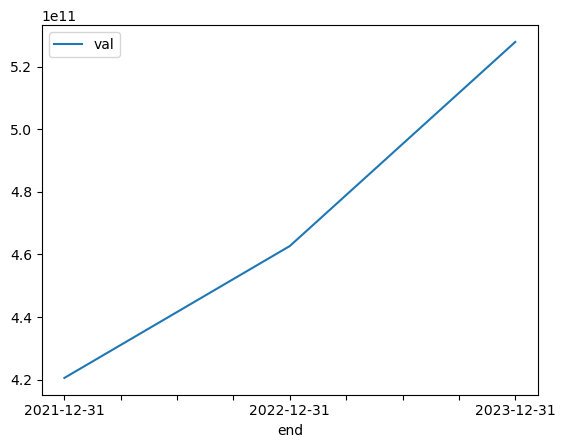

In [116]:
df.plot(x='end', y='val')